<a href="https://colab.research.google.com/github/naomifridman/Attention-Gated-Networks/blob/master/ISPY2/BrestDCEDL_ISPY2_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BreastDCEDL_ISPY2
## BreastDCEDL_ISPY2 Data Explore and Visualize
## No Download needed to Use this demo !


#### Author: Tomer Fridman
#### Date: 2025-08-9


In [10]:
from sklearn.metrics import classification_report,auc,roc_auc_score
from PIL import Image
import time
from pathlib import Path


import os
import numpy as np
import pandas as pd
from PIL import Image


import warnings
warnings.filterwarnings('ignore', '.*do not.*', )
warnings.warn('Do not show this message')

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from glob import glob
#from skimage import io
from sklearn.utils import shuffle

#from nipype.interfaces.ants import N4BiasFieldCorrection
import sys
import os
import ast
import re
import nibabel as nib
import warnings
warnings.filterwarnings('ignore')

In [11]:
def show_n_images(
    imgs,
    cmap="gray",
    titles=None,
    enlarge=4,
    mtitle=None,
    cut=False,
    axis_off=True,
    fontsize=15,
    cb=False,
):
    """Visualise *n* images side-by-side."""
    _ = plt.figure(figsize=(enlarge * len(imgs), enlarge * 2))
    for i, im in enumerate(imgs, 1):
        ax = plt.subplot(1, len(imgs), i)
        if cb and len(np.unique(im)) > 5:
            im = cont_br(im)
        ax.imshow(im[50:290, 75:450] if cut else im, cmap=cmap, origin="lower")
        if titles is not None:
            ax.set_title(titles[i - 1], fontsize=fontsize)
        if axis_off:
            ax.axis("off")
    if mtitle:
        plt.suptitle(mtitle, fontsize=fontsize + 2)
    plt.tight_layout(); plt.show()


In [12]:
# --------------------------------------------------------------------- #
#                       NIfTI I/O utilities                             #
# --------------------------------------------------------------------- #
def read_nifti(path: str) -> np.ndarray:
    return nib.load(path).get_fdata()

def _last_int(path):
    m = re.search(r"(\d+)\.nii\.gz$", path)
    return int(m.group(1)) if m else -1


def get_sorted_nifti_acquisitions(pid):

    for part in os.listdir(dce_path):
        path = os.path.join(dce_path, part, pid)
        if os.path.isdir(path):
            files = sorted(f for f in os.listdir(path) if f.endswith('.nii.gz'))
            if deb:
                print("Found:", path)
                print("Files:", files)
            return [read_nifti(os.path.join(path, f)) for f in files]
    return []



def get_nifti_mask(pid: str):

    mpath = mask_path
    if deb: print(mpath)

    ff = [x for x in os.listdir(mpath) if pid in x]

    if deb:print(ff)
    if len(ff)==0: return None

    f=ff[0]

    x = read_nifti(os.path.join(mpath, f))

    return x


In [13]:
def minmax(m):
    if m.max()==0:
        return m
    m = (m-m.min())/(m.max()-m.min())
    return m

def to_rgb(a,b,c):

    stack_axis = a.ndim

    # Stack along the next axis
    im = np.stack([minmax(a), minmax(b), minmax(c)], axis=stack_axis)

    return im

# Download data from zenodo


In [1]:
!wget https://zenodo.org/records/17578255/files/BreastDCEDL_ISPY2_mask.tar.gz
!tar -xvzf BreastDCEDL_ISPY2_mask.tar.gz
!wget  https://zenodo.org/records/17578255/files/BreastDCEDL_ISPY2_metadata.csv

--2025-11-14 14:01:20--  https://zenodo.org/records/17578255/files/BreastDCEDL_ISPY2_mask.tar.gz
Resolving zenodo.org (zenodo.org)... 188.185.43.153, 188.185.48.75, 137.138.52.235, ...
Connecting to zenodo.org (zenodo.org)|188.185.43.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26059517 (25M) [application/octet-stream]
Saving to: ‘BreastDCEDL_ISPY2_mask.tar.gz’

BreastDCEDL_ISPY2_m 100%[===================>]  24.85M  3.29MB/s    in 20s     

2025-11-14 14:01:41 (1.22 MB/s) - ‘BreastDCEDL_ISPY2_mask.tar.gz’ saved [26059517/26059517]

BreastDCEDL_ISPY2_mask/
BreastDCEDL_ISPY2_mask/ACRIN-6698-102212_ACRIN-6698-102212_spy2_vis1_mask.nii.gz
BreastDCEDL_ISPY2_mask/ACRIN-6698-103939_ACRIN-6698-103939_spy2_vis1_mask.nii.gz
BreastDCEDL_ISPY2_mask/ACRIN-6698-104268_ACRIN-6698-104268_spy2_vis1_mask.nii.gz
BreastDCEDL_ISPY2_mask/ACRIN-6698-107700_ACRIN-6698-107700_spy2_vis1_mask.nii.gz
BreastDCEDL_ISPY2_mask/ACRIN-6698-108969_ACRIN-6698-108969_spy2_vis1_mask.nii.gz

## Download dce data to dce directory
* follow this example to all other dce data files

In [2]:
!wget https://zenodo.org/records/17578255/files/BreastDCEDL_ISPY2_pcr_dce_part6.tar.gz
![ -d dce ] || mkdir dce
!tar -xvzf BreastDCEDL_ISPY2_pcr_dce_part6.tar.gz -C dce

--2025-11-14 14:03:05--  https://zenodo.org/records/17578255/files/BreastDCEDL_ISPY2_pcr_dce_part6.tar.gz
Resolving zenodo.org (zenodo.org)... 137.138.52.235, 188.185.43.153, 188.185.48.75, ...
Connecting to zenodo.org (zenodo.org)|137.138.52.235|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1254686785 (1.2G) [application/octet-stream]
Saving to: ‘BreastDCEDL_ISPY2_pcr_dce_part6.tar.gz’

BreastDCEDL_ISPY2_p 100%[===================>]   1.17G  2.26MB/s    in 7m 17s  

2025-11-14 14:10:23 (2.74 MB/s) - ‘BreastDCEDL_ISPY2_pcr_dce_part6.tar.gz’ saved [1254686785/1254686785]

dce_part6/
dce_part6/ISPY2-913225/
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis1_dce_aqc_0.nii.gz
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis1_dce_aqc_1.nii.gz
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis1_dce_aqc_2.nii.gz
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis1_dce_aqc_3.nii.gz
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis1_dce_aqc_4.nii.gz
dce_part6/ISPY2-913225/ISPY2-913225_spy2_vis

In [5]:
!ls dce/dce_part6/

ISPY2-913225  ISPY2-930853  ISPY2-950131  ISPY2-962664	ISPY2-981664
ISPY2-916645  ISPY2-940186  ISPY2-955953  ISPY2-966016	ISPY2-983841
ISPY2-923968  ISPY2-943879  ISPY2-959366  ISPY2-974181	ISPY2-997702
ISPY2-924868  ISPY2-944536  ISPY2-960490  ISPY2-974618	ISPY2-999264


In [6]:
# set to base of your local nifti data
data_path="."

In [8]:
# Set up your local nifti path's
import os
dce_path= os.path.join(data_path,"dce")

mask_path=os.path.join(data_path,"BreastDCEDL_ISPY2_mask")

In [14]:
df=pd.read_csv('BreastDCEDL_ISPY2_metadata.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982 entries, 0 to 981
Data columns (total 29 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   pid             982 non-null    object 
 1   pCR             982 non-null    float64
 2   n_xy            982 non-null    float64
 3   n_z             982 non-null    float64
 4   n_times         982 non-null    float64
 5   pre             982 non-null    float64
 6   post_early      982 non-null    float64
 7   post_late       982 non-null    float64
 8   slice_thick     982 non-null    float64
 9   xy_spacing      982 non-null    float64
 10  mask_start      982 non-null    float64
 11  mask_end        982 non-null    float64
 12  sraw            982 non-null    float64
 13  eraw            982 non-null    float64
 14  scol            982 non-null    float64
 15  ecol            982 non-null    float64
 16  tum_vol         982 non-null    float64
 17  age             982 non-null    flo

In [15]:
df.test.value_counts(dropna=False)

,count
test,
0.0,784
1.0,99
2.0,99


In [16]:
df.pCR.value_counts(dropna=False)

,count
pCR,
0.0,666
1.0,316


In [17]:
pd.crosstab(df.test,df.pCR, dropna=False)

pCR,0.0,1.0
test,,
0.0,532,252
1.0,67,32
2.0,67,32


In [18]:
pd.crosstab(df.test,df.HR, dropna=False)

HR,0.0,1.0
test,,
0.0,351,433
1.0,45,54
2.0,50,49


In [19]:
pd.crosstab(df.test,df.HER2, dropna=False)

HER2,0.0,1.0
test,,
0.0,586,198
1.0,77,22
2.0,77,22


In [20]:
os.listdir(mask_path)[:4]

['ISPY2-660534_ISPY2-660534_spy2_vis1_mask.nii.gz',
 'ISPY2-406190_ISPY2-406190_spy2_vis1_mask.nii.gz',
 'ACRIN-6698-240957_ACRIN-6698-240957_spy2_vis1_mask.nii.gz',
 'ACRIN-6698-320538_ACRIN-6698-320538_spy2_vis1_mask.nii.gz']

## I-SPY-2 example

In [23]:
df[df.pid.isin(['ISPY2-913225'])]

,pid,pCR,n_xy,n_z,n_times,pre,post_early,post_late,slice_thick,xy_spacing,...,race_white,race_black,HR,HER2,HR_HER2_STATUS,TripleNeg,HER2pos,HRposHER2neg,dataset,test
927,ISPY2-913225,1.0,256.0,80.0,8.0,0.0,2.0,5.0,2.0,0.5664,...,0.0,0.0,1.0,1.0,HER2pos,0.0,1.0,0.0,spy2,0.0


In [24]:
deb=0

dce 80 256 (80, 256, 256) mask:  25 51 (80, 256, 256)


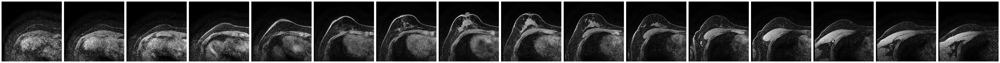

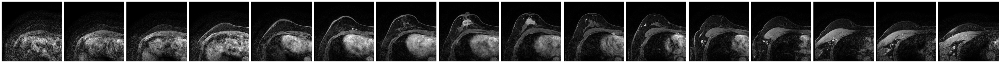

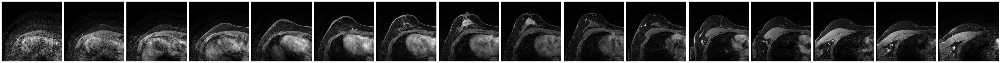

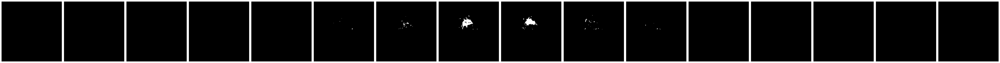

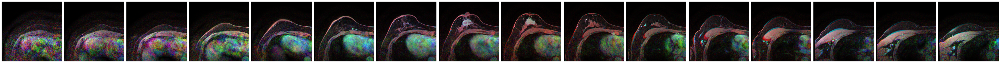

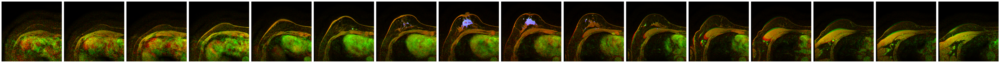

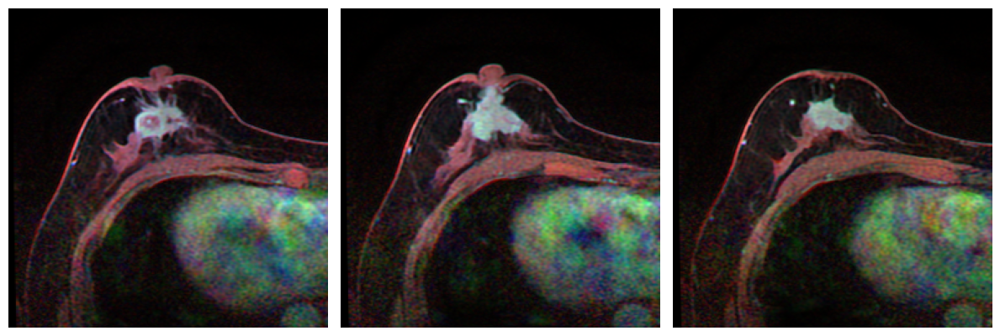

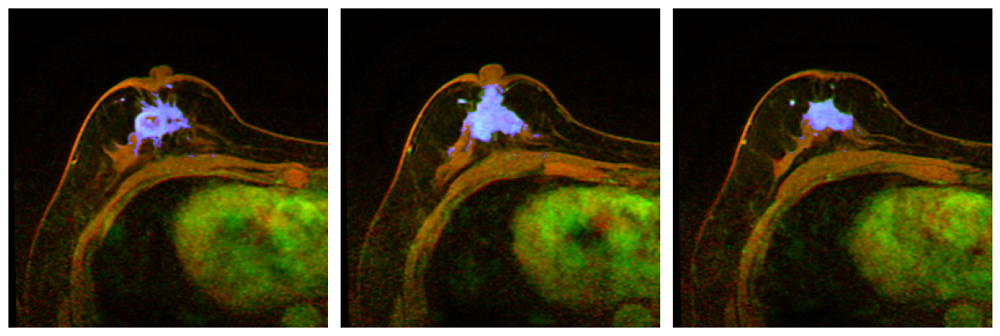

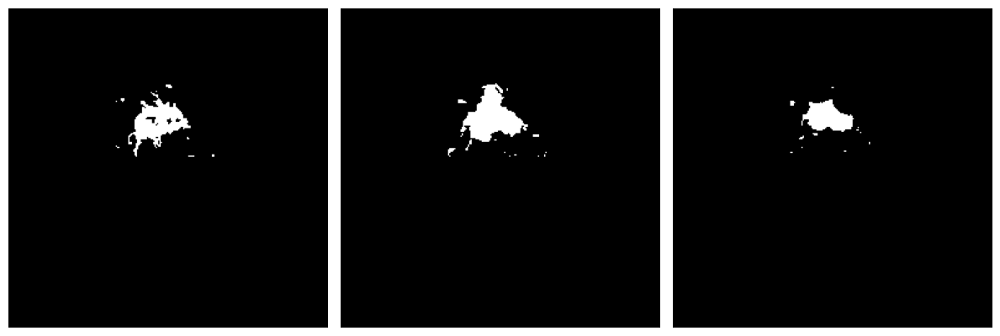

In [25]:

    pid='ISPY2-913225'

    row = df[df.pid==pid].iloc[0]
    smask=int(row['mask_start'])
    emask = int(row['mask_end'])
    pmask = (smask+emask)//2
    nz=int(row['n_z'])
    nxy=int(row['n_xy'])


    d=get_sorted_nifti_acquisitions(pid)
    m = get_nifti_mask(pid)

    print('dce',nz,nxy,d[0].shape, 'mask: ', smask,emask,  m.shape)

    show_n_images([d[0][k] for k in range(0,nz,5)])
    show_n_images([d[1][k] for k in range(0,nz,5)])
    show_n_images([d[2][k] for k in range(0,nz,5)])
    show_n_images([m[k] for k in range(0,nz,5)])
    show_n_images([to_rgb(d[0][k],d[1][k], d[2][k]) for k in range(0,nz,5)])
    show_n_images([to_rgb(d[0][k],d[1][k], m[k]) for k in range(0,nz,5)])
    show_n_images([to_rgb(d[0][k],d[1][k], d[2][k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([to_rgb(d[0][k],d[1][k], m[k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([ m[k] for k in [pmask-3,pmask,pmask+3]])




mask:  26 83


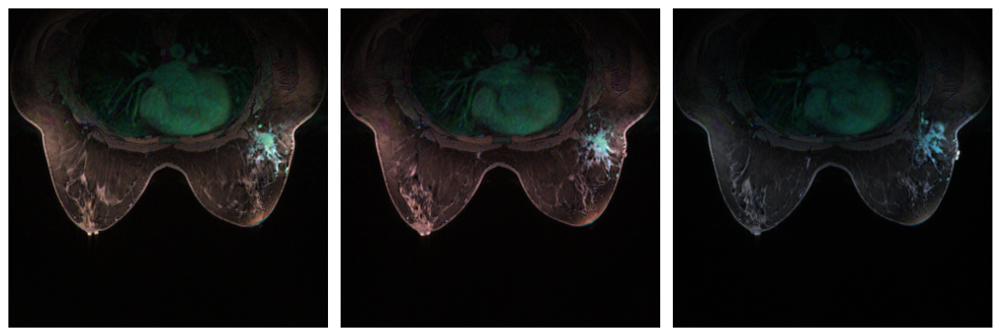

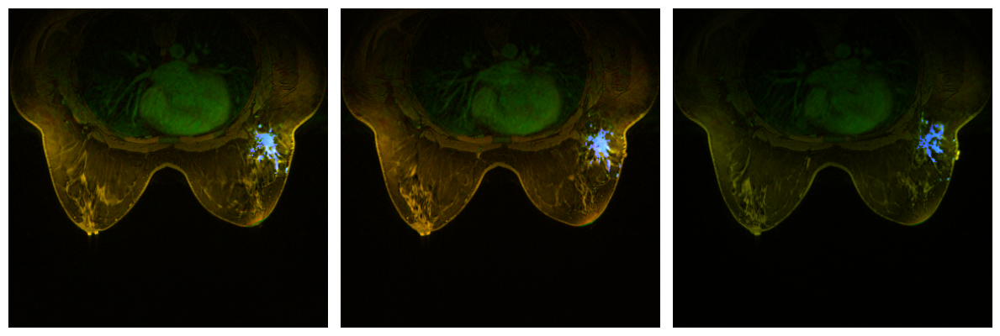

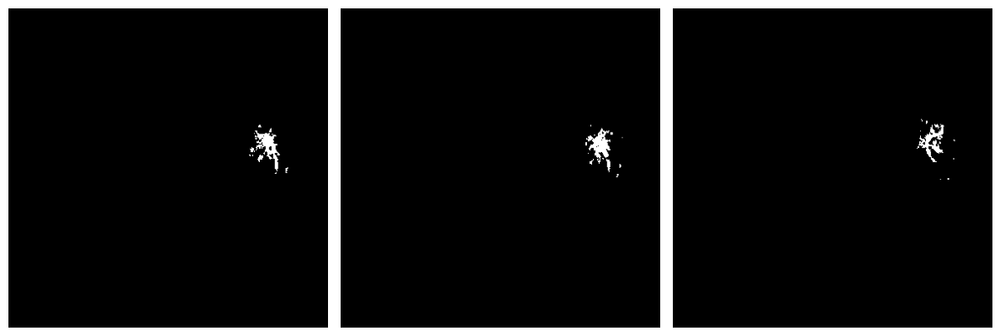

In [29]:

    pid='ISPY2-955953'
    row = df[df.pid==pid].iloc[0]
    smask=int(row['mask_start'])
    emask = int(row['mask_end'])
    pmask = (smask+emask)//2
    nz=int(row['n_z'])
    nxy=int(row['n_xy'])
    print('mask: ', smask,emask)

    d=get_sorted_nifti_acquisitions(pid)
    m = get_nifti_mask(pid)

    im=to_rgb(d[0],d[1], d[2])
    show_n_images([to_rgb(d[0][k],d[1][k], d[2][k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([to_rgb(d[0][k],d[1][k], m[k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([ m[k] for k in [pmask-3,pmask,pmask+3]])

mask:  18 63


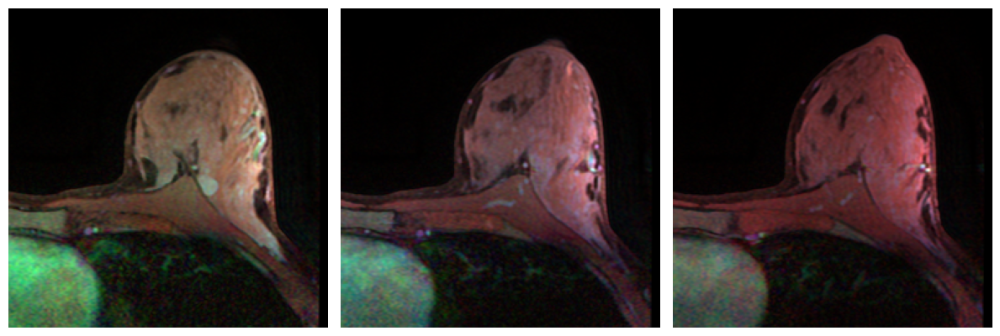

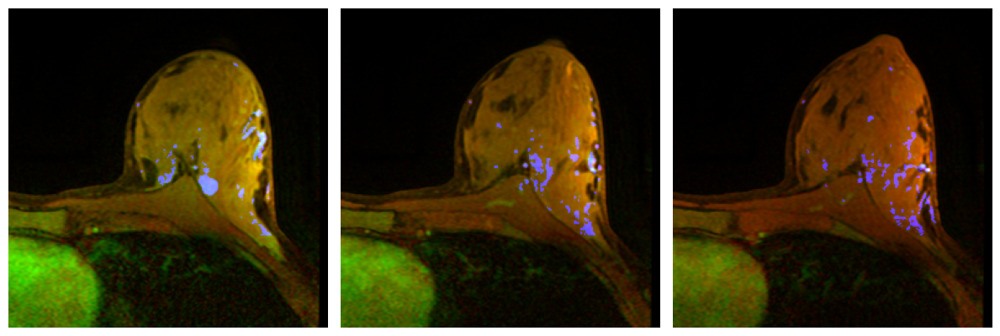

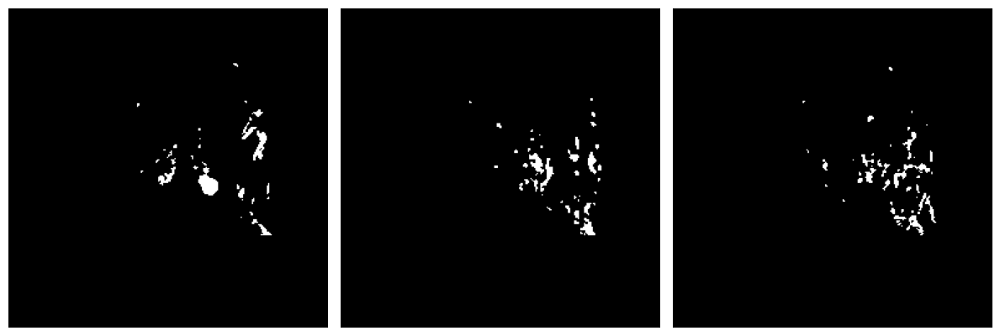

In [30]:

    pid='ISPY2-940186'
    row = df[df.pid==pid].iloc[0]
    smask=int(row['mask_start'])
    emask = int(row['mask_end'])
    pmask = (smask+emask)//2
    nz=int(row['n_z'])
    nxy=int(row['n_xy'])
    print('mask: ', smask,emask)

    d=get_sorted_nifti_acquisitions(pid)
    m = get_nifti_mask(pid)

    im=to_rgb(d[0],d[1], d[2])
    show_n_images([to_rgb(d[0][k],d[1][k], d[2][k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([to_rgb(d[0][k],d[1][k], m[k]) for k in [pmask-3,pmask,pmask+3]])
    show_n_images([ m[k] for k in [pmask-3,pmask,pmask+3]])